<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">Trabajo de fin de máster</p>
<p style="margin: 0; text-align:right;">Máster Universitario en Ciencia de Datos</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
<p style="margin: 0; text-align:right;">Azucena González Muiño</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>

# Explicabilidad del modelo y *fairness*

Para el modelo de vigilancia policial definido anteriormente, se aplican técnicas de explicabilidad agnósticas del modelo (LIME y SHAP) para entender mejor su comportamiento. Para revisar si presenta sesgos no deseados, se emplea además la librería Aequitas, que permite calcular fácilmente diversas métricas de equidad y realizar una comparativa visual.

Este *notebook* se divide en los siguientes apartados:
* Definición de funciones y variables globales
* Carga del modelo y predicciones sobre el conjunto de test
* Técnicas de explicabilidad
* Revisión de la equidad del modelo

In [1]:
# Manipulación de datos
import numpy as np
from numpy.random import rand
from numpy.random import seed
import pandas as pd

# Construcción y evaluación de modelos
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn import metrics

# Serialización de objetos
import pickle

# Tratamiento de fechas y timestamps
from datetime import datetime

# Librería para el estudio del fairness
from aequitas.group import Group
from aequitas.bias import Bias
from aequitas.fairness import Fairness
from aequitas.plotting import Plot
import aequitas.plot as ap

# LIME
import lime
import lime.lime_tabular
from lime import submodular_pick

# SHAP
import shap

# Generación de gráficas
import seaborn as sns
import matplotlib.pyplot as plt
import graphviz
%matplotlib inline

# Limitación del número de columnas a mostrar
pd.set_option('display.max_columns', None)

## 0. Definición de funciones

Este apartado recoge varias funciones y constantes que se emplean en las siguientes secciones.

In [2]:
# Etiquetas de clase
labels = ['False', 'True']

# Nombre de la variable objetivo
target = 'Further-action'

# Función que muestra gráficamente la matriz de confusión recibida como entrada indicando en
# cada celda el número de registros y el porcentaje que representan sobre el total
def conf_matrix_plot(conf_matrix, title='Matriz de confusión', labels=None, summary=False):
    # Se convierte la matriz a dataframe
    conf_matrix_df = pd.DataFrame(conf_matrix, columns=labels, index=labels)

    # Se generan los conjuntos de etiquetas a mostrar: nombres, total de registros y porcentaje
    # sobre el total
    group_names = ['TN','FP','FN','TP']
    group_counts = ['{0:.0f}'.format(value) for value in conf_matrix.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in conf_matrix.flatten()/np.sum(conf_matrix)]
    ext_labels = [f'{l1}\n{l2}\n{l3}' for l1, l2, l3 in zip(group_names, group_counts, group_percentages)]
    ext_labels = np.asarray(ext_labels).reshape(2, 2)
    
    # Se crea un heatmap con la matriz de confusión
    sns.heatmap(conf_matrix_df, annot=ext_labels, fmt='', cmap='Blues', linewidths=2, cbar_kws={"shrink": .8})
    
    plt.title(title, fontsize=14)
    plt.ylabel('Valores reales', fontsize=12)
    plt.xlabel('Predicciones', fontsize=12)
    plt.yticks(rotation=0)
    
    return plt

# Función que devuelve una gráfica con las características de mayor importancia para el modelo indicado
def features_by_importance_plot(features, model, top=None):
    feat_importance = pd.DataFrame(sorted(zip(features, model.feature_importances_), reverse=True, key=lambda x: x[1]),
                                   columns=['Feature', 'Importance'])
    if top is None:
        top = len(features)

    plt.figure(figsize=(15, 5))
    sns.set_style('whitegrid')
    sns.barplot(x='Feature', y='Importance', data=feat_importance.head(top), 
                palette='Blues_r')
    plt.xlabel('Característica', size=12)
    plt.ylabel('Importancia', size=12)
    plt.title('Características con mayor importancia', size=14)
    plt.xticks(rotation=90)
    
    return plt

## 1. Carga del modelo y realización de predicciones

Se recuperan desde fichero el modelo entrenado previamente y los conjuntos de datos usados.

In [3]:
# Se carga el modelo ya entrenado y los conjuntos de datos
model = pickle.load(open('model.sav', 'rb'))
orig_data = pickle.load(open('sel_data.sav', 'rb'))
X_train = pickle.load(open('x_train.sav', 'rb'))
y_train= pickle.load(open('y_train.sav', 'rb'))
X_val = pickle.load(open('x_val.sav', 'rb'))
y_val = pickle.load(open('y_val.sav', 'rb'))
X_test = pickle.load(open('x_test.sav', 'rb'))
y_test = pickle.load(open('y_test.sav', 'rb'))

# Variables empleadas por el modelo
features = X_test.columns

print('Mejor modelo obtenido:', model)
print('Características seleccionadas:', features.tolist())

Mejor modelo obtenido: RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=5, max_features='sqrt', min_samples_leaf=5,
                       n_estimators=50, random_state=22)
Características seleccionadas: ['Year', 'Income', 'Type_Person and Vehicle search', 'Type_Person search', 'Type_Vehicle search', 'Officer-ethnicity_Asian', 'Officer-ethnicity_Black', 'Officer-ethnicity_Other', 'Officer-ethnicity_Unknown', 'Officer-ethnicity_White']


Se ejecuta el modelo sobre los datos de prueba: sobre sus resultados se aplicarán posteriormente algunas técnicas de explicabilidad y equidad de modelos.

              precision    recall  f1-score   support

       False       0.79      0.77      0.78    180168
        True       0.32      0.35      0.33     55549

    accuracy                           0.67    235717
   macro avg       0.56      0.56      0.56    235717
weighted avg       0.68      0.67      0.68    235717



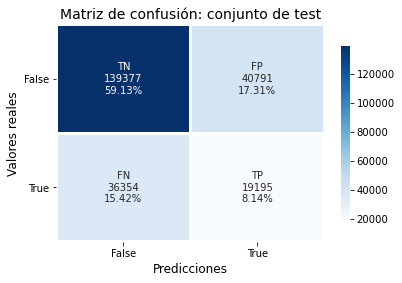

In [4]:
# Predicción para el conjunto de prueba
y_pred = model.predict(X_test)

# Generación de la matriz de confusión y del informe de métricas
tree_conf_matrix = metrics.confusion_matrix(y_test, y_pred)
tree_class_metrics = metrics.classification_report(y_test, y_pred, output_dict=True, zero_division=0)   

print(metrics.classification_report(y_test, y_pred, output_dict=False, zero_division=0))
conf_matrix_plot(tree_conf_matrix, 'Matriz de confusión: conjunto de test', labels).show()

## 2. Técnicas de explicabilidad

La importancia que cada variable tiene en el modelo final es uno de los métodos más directos para entender a alto nivel el comportamiento del modelo.    
En este caso, debido al *one hot encoding* aplicado a las variables categóricas, la importancia de las variables originales se diluye entre sus *dummies*, lo que puede dificultar la comparativa.

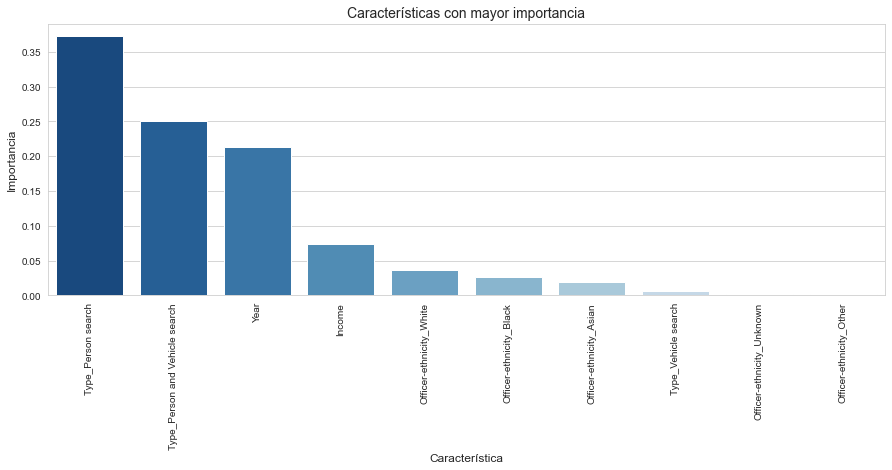

In [5]:
# Se muestran las variables con mayor importancia
features_by_importance_plot(features, model).show()

La variable con mayor importancia en el modelo es claramente el tipo de búsqueda y, en concreto, sus *dummies* para registro sobre persona y registro sobre persona y vehículo. Es interesante ver que el año tiene también bastante relevancia. En la variable etnia predominan la blanca y la negra.

En el caso de modelos basados en árboles de decisión, pintar la estructura del árbol permite visualizar fácilmente sus nodos y las condiciones que se aplican en ellos, a qué profundidad aparecen las distintas variables y cómo se distribuyen las predicciones. Dado que un *random forest* se compone de varios árboles de decisión, pueden visualizarse también, aunque extraer una visión global del funcionamiento del modelo es complicado debido a la variación de cada árbol, máxime si el número de estos es elevado. En este caso, el mejor modelo encontrado hace uso de 50 estimadores diferentes, por lo que se emplearán técnicas como LIME y SHAP para interpretar el modelo.

No obstante, a modo ilustrativo, se muestra a continuación uno de los árboles predictores.

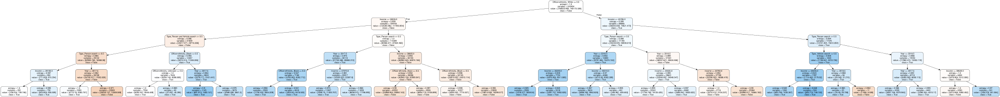

In [6]:
# Se visualiza uno de los estimadores
dot_data = tree.export_graphviz(model.estimators_[32],
                                out_file=None, 
                                feature_names=features,
                                class_names=labels,
                                filled=True,
                                rounded=True)
graph = graphviz.Source(dot_data, format='png')
graph.render('tree' + datetime.now().strftime('.%Y%m%d.%H%M'), view=True)
graph

El dibujo del árbol permite, de un primer vistazo, localizar uno de los problemas que ya se habían identificado previamente en el modelo: el poco margen existente en la clasificación de las observaciones. Los nodos finales del árbol presentan, en la mayoría de los casos, un nivel de impureza elevado, con muchos elementos tanto de la clase positiva como de la negativa.    
En cuanto a su interpretación, el nodo raíz realiza una primera división según la etnia. El lado derecho se corresponde con los registros que pertenecen a personas blancas y el izquierdo con los que no.    
Revisando el lado correspondiente a personas de etnia blanca, se localizan pocos nodos donde se clasifique el registro como negativo.
La otra parte del árbol presenta más variedad en sus clasificaciones. Puede destacarse, por ejemplo, que en aquellos distritos con ingresos superiores a 35035 libras y cuyo registro sea sobre la persona, aunque aparecen otros nodos de decisión, terminan clasificándose las observaciones en la clase negativa. Si el registro no es sobre la persona, se llega a una rama del árbol en la que todos los registros se terminan clasificando como positivos.

### 2.1 LIME

<a href='https://github.com/marcotcr/lime'>LIME</a> es una técnica de explicabilidad agnóstica del modelo que se basa en la aplicación de pequeños cambios en la entrada del modelo para observar cómo fluctúan las probabilidades a la salida.  

In [7]:
# Preparación del objeto necesario para ejecutar LIME
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_test),
                    feature_names=X_test.columns,
                    class_names=labels, 
                    verbose=False, mode='classification')

A continuación se seleccionan varios registros y se revisan individualmente empleando LIME. En azul se muestran las variables y los valores que ayudan a clasificar las actuaciones como negativas, y en naranja, los que aportan a la clase positiva.

Las dos primeras observaciones seleccionadas se corresponden a registros en distritos de renta alta, uno sobre una persona de etnia blanca y otro sobre una persona que no es blanca. Ambos son correctamente clasificados por el modelo: el primero es un registro positivo y el segundo negativo. En el segundo caso, obviando la etnia, es la variable de tipo de búsqueda la diferenciadora en la clasificación del registro como negativo.    
Parece que estar en un distrito con rentas altas aumenta la probabilidad de que el modelo clasifique el registro como positivo.

In [8]:
# Distrito de renta alta, etnia blanca
idx_test1 = X_test.index[(X_test['Income']>45000) & (X_test['Officer-ethnicity_White']==1)][0]
example = X_test.loc[idx_test1]
print('Clase real:', y_test[idx_test1])
exp = explainer.explain_instance(example, model.predict_proba, num_features=6)
exp.show_in_notebook(show_all=True)

Clase real: True


In [9]:
# Distrito de renta alta, etnia no blanca
idx_test2 = X_test.index[(X_test['Income']>45000) & (X_test['Officer-ethnicity_White']==0)][0]
example = X_test.loc[idx_test2]
print('Clase real:', y_test[idx_test2])
exp = explainer.explain_instance(example, model.predict_proba, num_features=6)
exp.show_in_notebook(show_all=True)

Clase real: False


A continuación se repite el ejercicio con distritos de renta baja.    
En este caso, el primero de los registros es correctamente clasificado como positivo, mientras que el segundo se clasifica como negativo siendo positivo.   
Se observa el efecto complementario a los ejemplos vistos previamente: las rentas bajas aumentan la probabilidad de que se clasifique el registro como negativo. En cuanto a la raza, ser blanco o no ser negro aumentan la probabilidad de pertenecer a la clase positiva. 

In [10]:
# Distrito de renta baja, etnia blanca
idx_test3 = X_test.index[(X_test['Income']<35000) & (X_test['Officer-ethnicity_White']==1)][0]
example = X_test.loc[idx_test3]
print('Clase real:', y_test[idx_test3])
exp = explainer.explain_instance(example, model.predict_proba, num_features=6)
exp.show_in_notebook(show_all=True)

Clase real: True


In [11]:
# Distrito de renta baja, etnia no blanca
idx_test4 = X_test.index[(X_test['Income']<35000) & (X_test['Officer-ethnicity_White']==0)][0]
example = X_test.loc[idx_test4]
print('Clase real:', y_test[idx_test4])
exp = explainer.explain_instance(example, model.predict_proba, num_features=6)
exp.show_in_notebook(show_all=True)

Clase real: True


LIME también permite realizar estudios sobre muestras del conjunto de datos. En el ejemplo siguiente se definen dos grupos, uno de personas de raza negra y otro para personas blancas.

In [12]:
# Se generan los dos grupos a comparar
subsample_black = X_test[(X_test['Officer-ethnicity_Black']==1)]
subsample_white = X_test[(X_test['Officer-ethnicity_White']==1)]

Se muestran a continuación las variables que más influyen en la toma de decisiones del modelo para una muestra de cada uno de los grupos definidos.

In [13]:
# Muestra para etnia negra
sp_obj = submodular_pick.SubmodularPick(explainer, 
                                        np.array(subsample_black),
                                        model.predict_proba,
                                        sample_size=100,
                                        num_features=6,
                                        num_exps_desired=1)
# Se muestran las explicaciones solicitadas
[exp.show_in_notebook() for exp in sp_obj.sp_explanations]

[None]

In [14]:
# Muestra para etnia blanca
sp_obj = submodular_pick.SubmodularPick(explainer, 
                                        np.array(subsample_white),
                                        model.predict_proba,
                                        sample_size=100,
                                        num_features=6,
                                        num_exps_desired=1)
# Se muestran las explicaciones solicitadas
[exp.show_in_notebook() for exp in sp_obj.sp_explanations]

[None]

Aunque se trata de una muestra sobre la población total, las gráficas anteriores corroboran lo observado en el análisis de importancia de características: la variable que más afecta a las predicciones es el tipo de registro. En cuanto al año, que el registro haya tenido lugar antes de 2021 aumenta la probabilidad de que el registro sea clasificado como negativo.    

Con el uso de SHAP se puede visualizar el comportamiento de las variables para todo el conjunto de observaciones, lo que permitirá llegar a conclusiones sobre el comportamiento general del modelo.

### 2.2 SHAP

A continuación se utiliza <a href='https://github.com/slundberg/shap'>SHAP</a> para revisar la importancia de las características y su impacto (negativo y positivo) en la predicción de la variable objetivo.   
En primer lugar, deben generarse los valores SHAP de cada observación del conjunto de datos.

In [15]:
# Se generan los objetos SHAP necesarios para el uso de esta librería y se activa javascript
shap.initjs()
shap_explainer = shap.TreeExplainer(model)
shap_values = shap_explainer.shap_values(X_test)

Las características más importantes calculadas por los valores SHAP son muy parecidas a las obtenidas previamente revisando la importancia asignada por el propio modelo. Sigue predominando el tipo de búsqueda y, aunque se producen algunos ligeros cambios de orden en algunas de las siguientes características (*Officer-ethnicity_White* e *Income*), siguen apareciendo las mismas en los primeros puestos.

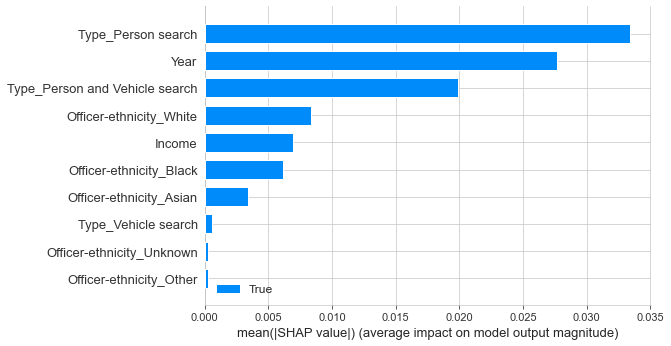

In [16]:
# Impacto de las principales características en el modelo
shap.summary_plot(shap_values, X_test, max_display=10, class_inds=[1], class_names=['False', 'True'])

En la siguiente gráfica aparecen recogidas todas las observaciones del conjunto de datos:
* Las características se muestran de mayor a menor relevancia o contribución a la predicción. Es decir, las variables que aparecen arriba en el eje Y tienen mayor impacto.
* La ubicación horizontal indica si el efecto de esa observación está asociada con una predicción mayor o menor
* El color rojo representa que la variable tiene un valor alto (1 en el caso de las *dummies*). El azul representa un valor bajo (0 para las *dummies*).
* La correlación con la variable objetivo se muestra en el eje X: por debajo de 0 es negativa y por encima es positiva.

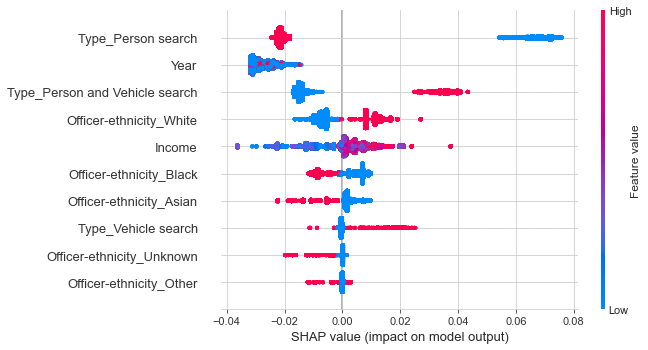

In [17]:
# Se muestra el impacto de las características para cada observación del conjunto de datos seleccionado
# en relación a la clase positiva
shap.summary_plot(shap_values[1], X_test)

De la gráfica anterior puede deducirse que un cacheo sobre una persona (variable a 1, color rojo) contribuye a que el modelo decida que la acción policial sea negativa (correlación negativa), mientras que si el registro no es sobre una persona aumenta la probabilidad de que la actuación policial sea positiva (es decir, que se encuentren indicios de delito). Este efecto se refuerza observando la información de la siguiente *dummy* relativa al tipo de registro, donde se muestra que actuaciones policiales sobre el individuo y su vehículo influyen positivamente en que el modelo clasifique la acción policial como positiva, y para actuaciones que no lo son lo haga en sentido contrario.

En cuanto a las etnias:
* Ser de etnia blanca aumenta la probabilidad de que el registro sea positivo, mientras que no serlo la disminuye
* Ser de etnia negra o asiática tiene una correlación negativa con una acción policial exitosa, es decir, ser de cualquiera de estas razas contribuye a una clasificación de registro infructuoso

Respecto al nivel de ingresos familiares, en general parece que los distritos más ricos influyen positivamente en clasificar las actuaciones como exitosas, mientras que los de rentas más bajas lo hacen en sentido contrario.

En cuanto al año, a pesar de ser una de las variables con mayor importancia en el modelo, todas las observaciones parecen mantener una correlación negativa con la clase positiva. Aparecen pocas observaciones en rojo porque en el conjunto de test están recogidos los registros más actuales y sólo se incluyen dos meses de 2021. Si se visualiza esta misma gráfica para el conjunto de entrenamiento, se entiende el comportamiento del modelo: los años menos recientes tienen un impacto positivo en la predicción de registros exitosos y los más recientes tienen justo el efecto contrario.

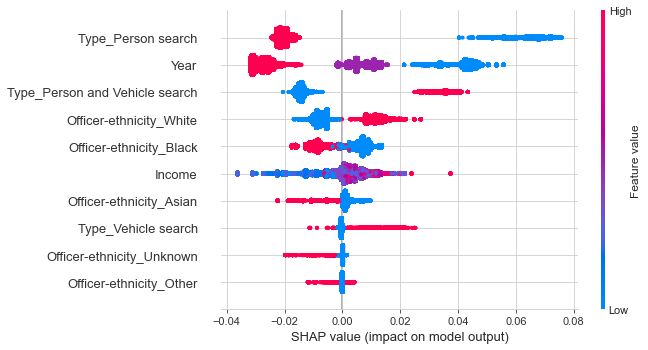

In [18]:
# Visualización del impacto con el conjunto de entrenamiento
shap_explainer_tr = shap.TreeExplainer(model)
shap_values_tr = shap_explainer.shap_values(X_train)
shap.summary_plot(shap_values_tr[1], X_train)

SHAP también permite estudiar las observaciones una a una. En las siguientes gráficas, se recogen las predicciones en referencia a la clase positiva para los mismos registros revisados en LIME:
* Los bloques en azul rebajan la probabilidad de la predicción realizada
* Los bloques en rojo aumentan la probabilidad de la predicción realizada
* Cuanto mayor es el bloque, más influencia tiene la variable

En el primer ejemplo, las variables que aumentan la probabilidad de que la clase sea positiva coinciden con las vistas en el estudio con LIME, a diferencia del año, que según SHAP reduce la probabilidad de predecir el registro como positivo.

In [19]:
# Renta alta, etnia blanca
shap_values_1 = shap_explainer.shap_values(X_test.loc[idx_test1])
shap.force_plot(shap_explainer.expected_value[1], shap_values_1[1], X_test.loc[idx_test1])

En este caso, el nivel de ingresos (elevado, pertenece a un distrito con un alto nivel de vida) y que la etnia no sea negra, son las variables que aumentan la probabilidad de que el modelo clasifique la observación como positiva. Las que más aportan a rebajar esa probabilidad son el año, que el tipo de búsqueda sea sobre persona (y no sobre persona y vehículo) y que la raza no sea la blanca.

In [20]:
# Renta alta, etnia no blanca
shap_values_2 = shap_explainer.shap_values(X_test.loc[idx_test2])
shap.force_plot(shap_explainer.expected_value[1], shap_values_2[1], X_test.loc[idx_test2])

El siguiente ejemplo, a excepción del año, también coincide con el análisis de LIME: el tipo de búsqueda y la etnia aumentan la probabilidad de una clasificación en la clase positiva, y el *income* la reduce.

In [21]:
# Renta baja, etnia blanca
shap_values_3 = shap_explainer.shap_values(X_test.loc[idx_test3])
shap.force_plot(shap_explainer.expected_value[1], shap_values_3[1], X_test.loc[idx_test3])

En el último caso, la única variable que aumenta la probabilidad de una clasificación positiva es que la etnia no sea negra y lo hace además con muy poco impacto.

In [22]:
# Renta baja, etnia no blanca
shap_values_4 = shap_explainer.shap_values(X_test.loc[idx_test4])
shap.force_plot(shap_explainer.expected_value[1], shap_values_4[1], X_test.loc[idx_test4])

## 3. Equidad del modelo

Para la revisión del modelo generado desde el punto de vista del *fairness* o la equidad algorítmica, se emplea la librería de <a href='http://www.datasciencepublicpolicy.org/projects/aequitas/'>Aequitas</a>, implementada por la Universidad de Chicago.    
Las métricas de equidad que se van a revisar son la tasa de falsos positivos y la de falsos negativos sobre los grupos de etnia y distrito (se utilizan los nombres de los distritos en lugar de sus ingresos para facilitar su interpretación).

In [23]:
# Para esta comparativa se pueden emplear las variables originales, sin one hot encoding.
# Se procede a seleccionar los registros de test e incorporar los valores predichos por el modelo
test_data = orig_data.tail(len(y_test)).copy(deep=True)

# La librería Aequitas necesita que los valores reales estén en una columna llamada 'label_value'
# y las predicciones en 'score'
test_data.rename(columns={'Further-action':'label_value'}, inplace=True)
test_data['score'] = y_pred
test_data.head()

# Se inicializan algunos elementos necesarios para la ejecución de la librería
g = Group()
b = Bias()
aqp = Plot()

# Se indican las variables a estudio y las métricas seleccionadas
attributes_to_audit = ['Officer-ethnicity', 'Borough']
metrics = ['fpr', 'fnr']

# Se obtiene un dataframe con las estadísticas por variable y grupo y las métricas de fairness calculadas
xtab, _ = g.get_crosstabs(test_data, attr_cols=attributes_to_audit)

# Para las gráficas de disparidad se toman como variables de referencia la etnia negra y el distrito de Lambeth (ya
# que tiene un nivel de ingresos familiares intermedio)
bdf = b.get_disparity_predefined_groups(xtab, test_data, 
                                        ref_groups_dict={'Officer-ethnicity':'Black', 'Borough':'Lambeth'},
                                        fill_divbyzero=0)

# Estadísticas y métricas para la etnia
xtab_eth = xtab[(xtab['attribute_name']=='Officer-ethnicity')]
xtab_eth

get_disparity_predefined_group()


,model_id,score_threshold,k,attribute_name,attribute_value,tpr,tnr,for,fdr,fpr,fnr,npv,precision,pp,pn,ppr,pprev,fp,fn,tn,tp,group_label_pos,group_label_neg,group_size,total_entities,prev
0,0,binary 0/1,59986,Officer-ethnicity,Asian,0.373237,0.743206,0.203727,0.693985,0.256794,0.626763,0.796273,0.306015,12104,30531,0.201780,0.283898,8400,6220,24311,3704,9924,32711,42635,235717,0.232767
1,0,binary 0/1,59986,Officer-ethnicity,Black,0.350147,0.765906,0.202639,0.690604,0.234094,0.649853,0.797361,0.309396,21988,62308,0.366552,0.260843,15185,12626,49682,6803,19429,64867,84296,235717,0.230485
2,0,binary 0/1,59986,Officer-ethnicity,Other,0.352804,0.746512,0.197787,0.716432,0.253488,0.647196,0.802213,0.283568,3195,8403,0.053262,0.275479,2289,1662,6741,906,2568,9030,11598,235717,0.221417
3,0,binary 0/1,59986,Officer-ethnicity,Unknown,0.814669,0.356683,0.169664,0.667557,0.643317,0.185331,0.830336,0.332443,3742,1668,0.062381,0.691682,2498,283,1385,1244,1527,3883,5410,235717,0.282255
4,0,binary 0/1,59986,Officer-ethnicity,White,0.295824,0.821763,0.213716,0.655114,0.178237,0.704176,0.786284,0.344886,18957,72821,0.316024,0.206553,12419,15563,57258,6538,22101,69677,91778,235717,0.240809


A continuación se muestran las gráficas de las tasas de falsos positivos y falsos negativos.

In [24]:
# Gráficas para FPR y FNR
ap.disparity(bdf, metrics, 'Officer-ethnicity')

alt.LayerChart(...)

Puede observarse cómo las personas de raza blanca tienen una menor tasa de falsos positivos y también, aunque se sitúa dentro del umbral aceptable definido, una mayor tasa de falsos negativos.
Para el caso de la etnia sin valor conocido, sorprende su disparidad con el resto de grupos. No es posible determinar si el origen de estos valores perdidos conlleva cierta intencionalidad por parte del oficial que realiza la intervención o si puede estar reflejando un problema de calidad de la información recogida, por lo que no se pueden extraer conclusiones que expliquen una diferencia tan notable.

Se representan a continuación los valores de las dos métricas indicadas, donde aparecen en rojo aquellos elementos que no cumplirían los criterios de *fairness* respcto al grupo de referencia establecido (etnia negra).

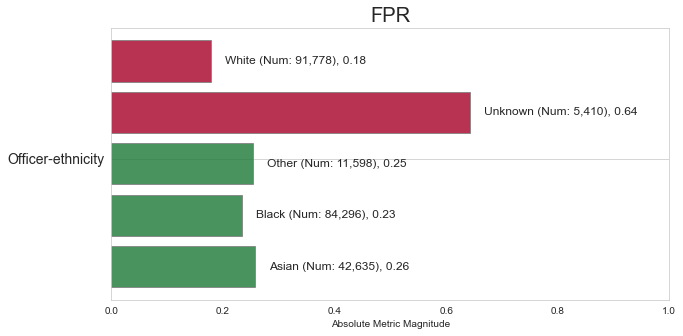

In [25]:
# Gráfica con la tasa de falsos positivos
f = Fairness()
fdf = f.get_group_value_fairness(bdf[bdf['attribute_name']=='Officer-ethnicity'].copy(deep=True))
fpr_fairness = aqp.plot_fairness_group(fdf, group_metric='fpr', title=True)

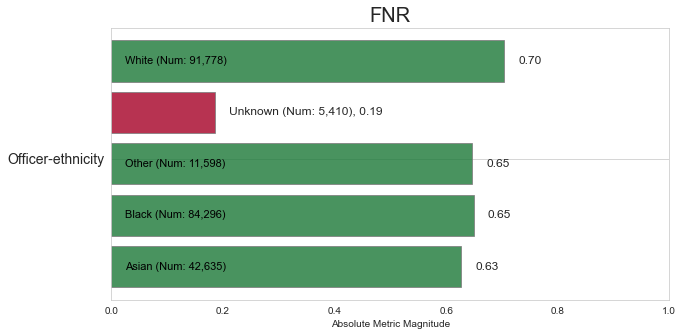

In [26]:
# Gráfica con la tasa de falsos negativos
f = Fairness()
fdf = f.get_group_value_fairness(bdf[bdf['attribute_name']=='Officer-ethnicity'].copy(deep=True))
fpr_fairness = aqp.plot_fairness_group(fdf, group_metric='fnr', title=True)

A continuación se realiza un estudio similar para los distritos. En este caso, como ya se indicaba previamente, van a utilizarse los nombres de los distritos en lugar de los ingresos familiares para facilitar el estudio.

In [27]:
# Estadísticas y métricas por distrito
xtab_bor = xtab[(xtab['attribute_name']=='Borough')]
xtab_bor

,model_id,score_threshold,k,attribute_name,attribute_value,tpr,tnr,for,fdr,fpr,fnr,npv,precision,pp,pn,ppr,pprev,fp,fn,tn,tp,group_label_pos,group_label_neg,group_size,total_entities,prev
5,0,binary 0/1,59986,Borough,Barking and Dagenham,0.389153,0.755777,0.224800,0.636248,0.244223,0.610847,0.775200,0.363752,1578,4008,0.026306,0.282492,1004,901,3107,574,1475,4111,5586,235717,0.264053
6,0,binary 0/1,59986,Borough,Barnet,0.439922,0.690236,0.219939,0.669578,0.309764,0.560078,0.780061,0.330422,1374,2628,0.022905,0.343328,920,578,2050,454,1032,2970,4002,235717,0.257871
7,0,binary 0/1,59986,Borough,Bexley,0.404588,0.738679,0.243082,0.618486,0.261321,0.595412,0.756918,0.381514,1017,2349,0.016954,0.302139,629,571,1778,388,959,2407,3366,235717,0.284908
8,0,binary 0/1,59986,Borough,Brent,0.406087,0.714185,0.198285,0.702957,0.285815,0.593913,0.801715,0.297043,2875,6299,0.047928,0.313386,2021,1249,5050,854,2103,7071,9174,235717,0.229235
9,0,binary 0/1,59986,Borough,Bromley,0.376409,0.766667,0.183102,0.692260,0.233333,0.623591,0.816898,0.307740,1628,4533,0.027140,0.264243,1127,830,3703,501,1331,4830,6161,235717,0.216036
10,0,binary 0/1,59986,Borough,Camden,0.241007,0.838302,0.191346,0.719665,0.161698,0.758993,0.808654,0.280335,1673,7719,0.027890,0.178130,1204,1477,6242,469,1946,7446,9392,235717,0.207198
11,0,binary 0/1,59986,Borough,City of London,0.279503,0.834990,0.216418,0.648438,0.165010,0.720497,0.783582,0.351562,384,1608,0.006401,0.192771,249,348,1260,135,483,1509,1992,235717,0.242470
12,0,binary 0/1,59986,Borough,Croydon,0.376857,0.768635,0.203239,0.661160,0.231365,0.623143,0.796761,0.338840,2845,7843,0.047428,0.266186,1881,1594,6249,964,2558,8130,10688,235717,0.239334
13,0,binary 0/1,59986,Borough,Ealing,0.399417,0.767658,0.197192,0.649467,0.232342,0.600583,0.802808,0.350533,2345,6268,0.039092,0.272263,1523,1236,5032,822,2058,6555,8613,235717,0.238941
14,0,binary 0/1,59986,Borough,Enfield,0.491268,0.699366,0.189480,0.655668,0.300634,0.508732,0.810520,0.344332,1879,3536,0.031324,0.346999,1232,670,2866,647,1317,4098,5415,235717,0.243213


Al revisar la tasa de falsos positivos, se localiza un sesgo muy pronunciado en Tower Hamlets. Para este distrito, el modelo seleccionado comete muchos menos errores de tipo I que para el resto de distritos. En el caso contrario se encuentra Harrow, con un FPR algo superior al resto, aunque no tan pronunciado como Tower Hamlets; Harrow es, además, uno de los distritos con menor criminalidad de Londres.

In [28]:
# Gráfica para FPR y FNR
ap.disparity(bdf, metrics, 'Borough')

alt.LayerChart(...)

En cuanto a los falsos negativos, aunque sigue habiendo sesgo en Tower Hamlets y Harrow, es muy poco acusado y está muy cerca del umbral predefinido como aceptable.

En las siguientes gráficas pueden visualizarse las tasas para los distritos con más representación, donde distritos muy turísticos como Westminster o Camden tienen un FPR inferior. En el caso del FNR, sólo Tower Hamlets aparece entre los distritos con más representación que incumplen el umbral de equidad establecido.

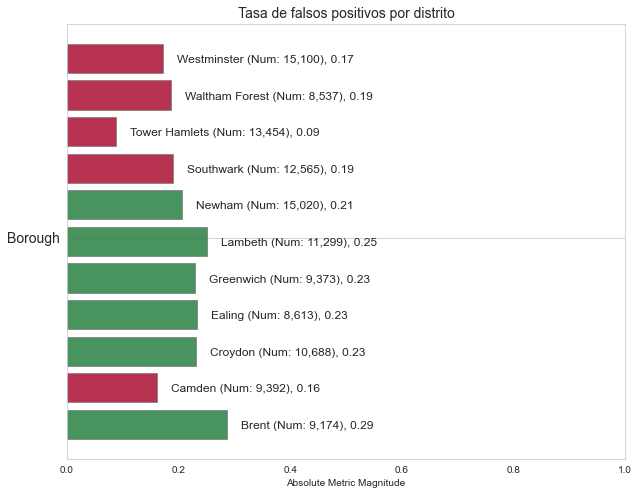

In [29]:
# Se muestra el FPR de los grupos con más representación
f = Fairness()
fig, ax = plt.subplots(figsize=(10,8))
ax.set_title('Tasa de falsos positivos por distrito', fontsize=14)
fdf = f.get_group_value_fairness(bdf[bdf['attribute_name']=='Borough'].copy(deep=True))
fpr_fairness = aqp.plot_fairness_group(fdf, group_metric='fpr', min_group_size=0.035, ax=ax)

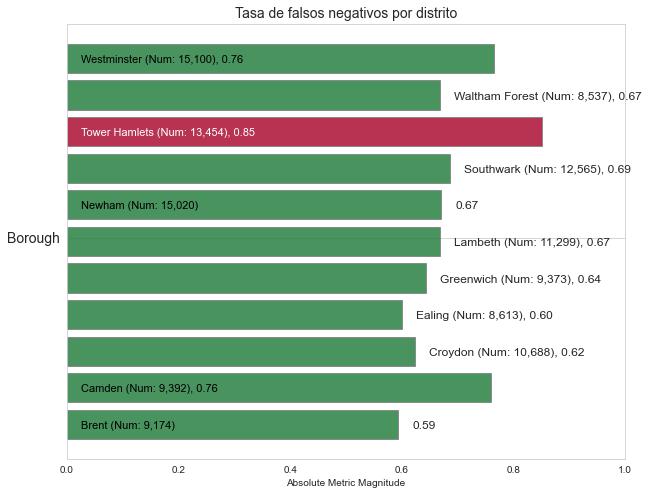

In [30]:
# Se muestra el FNR de los grupos con más representación
f = Fairness()
fig, ax = plt.subplots(figsize=(10,8))
ax.set_title('Tasa de falsos negativos por distrito', fontsize=14)
fdf = f.get_group_value_fairness(bdf[bdf['attribute_name']=='Borough'].copy(deep=True))
fnr_fairness = aqp.plot_fairness_group(fdf, group_metric='fnr', min_group_size=0.035, ax=ax)

Con la función *summary* se muestra el resumen de las métricas aplicadas para cada atributo y si se han cubierto los requisitos de equidad definidos (el umbral de tolerancia empleado es el establecido por defecto, 1.25).

In [31]:
# Resumen de la evaluación del modelo según las métricas examinadas y el umbral establecido
ap.summary(bdf, metrics)

alt.VConcatChart(...)